In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from netCDF4 import Dataset
import xarray as xr


In [158]:
data = np.load("vae_mu_128.npy")

solar =  Dataset('data/Solar_forcing_1st_mill.nc', 'r').variables['TSI'][:, 0, 0]


In [159]:
data.shape
solar.shape


(999,)

<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
 

<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
 

<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
 

<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
 

<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots(figsize=(15,3))
<ipython-input-160-5392fb2eb15f>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
 

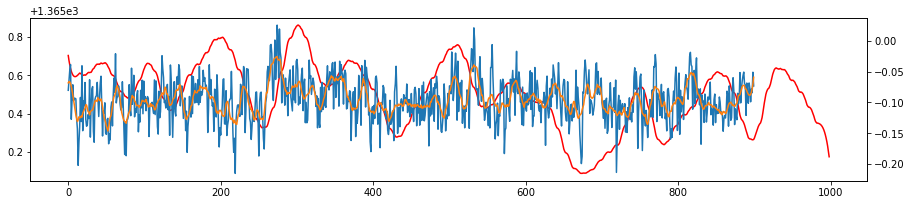

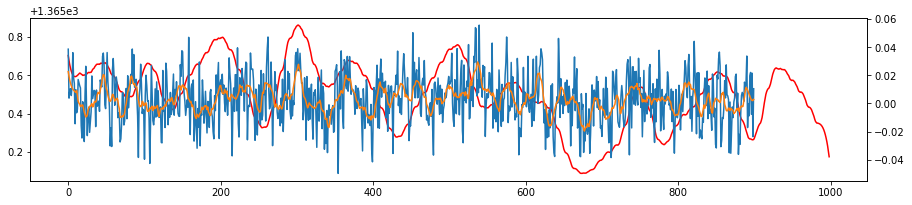

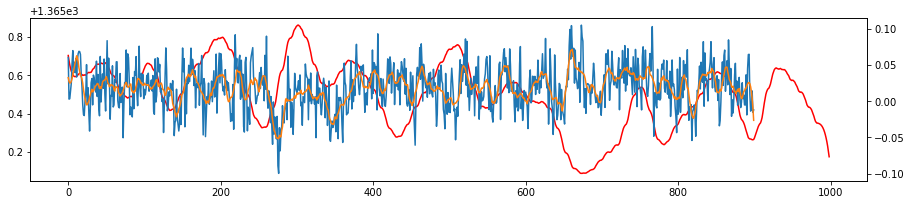

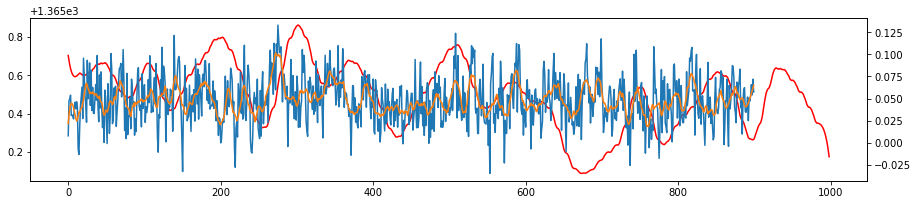

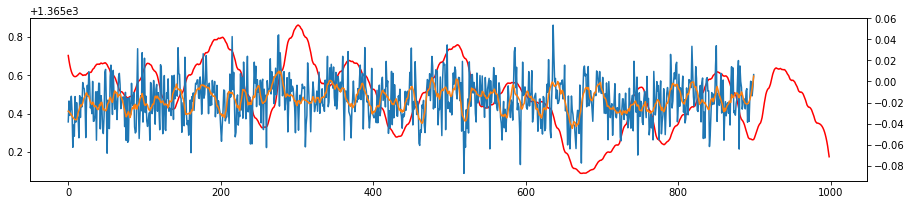

...

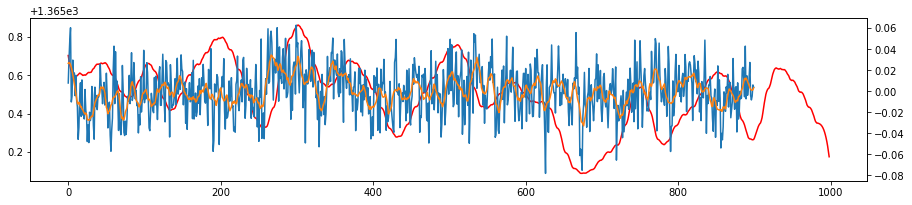

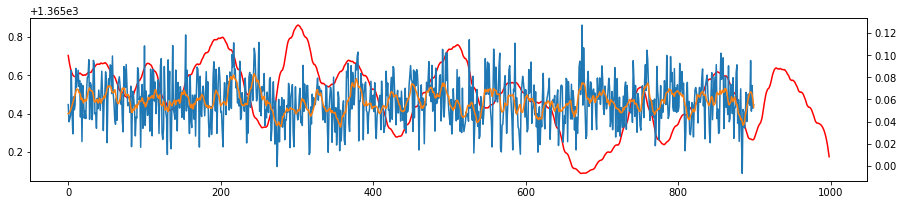

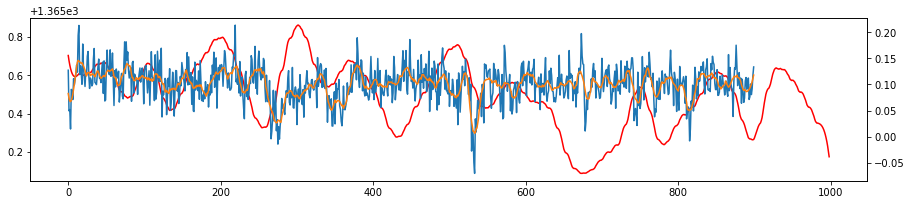

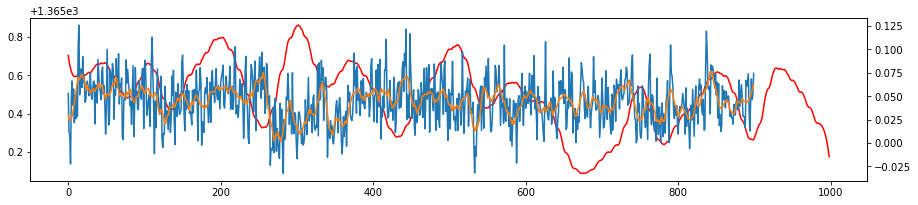

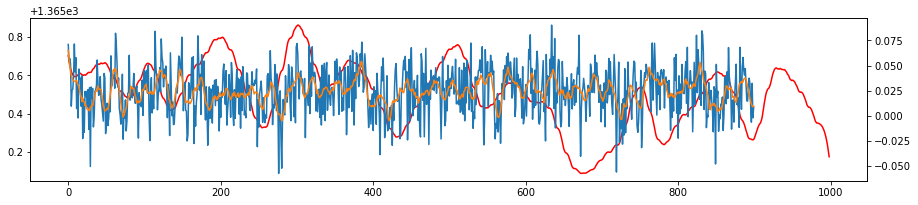

In [160]:
for i in range(data.shape[-1]):
    from scipy.signal import savgol_filter
    non_smoothed = data[:,0,0,i]
    fig, ax1 = plt.subplots(figsize=(15,3))
    ax1.plot(savgol_filter(solar, 31,3), "r")

    smoothed = savgol_filter(data[:,0,0,i], 21, 3)
    ax2 = ax1.twinx()
    ax2.plot(non_smoothed)
    ax2.plot(smoothed)
    
    

In [161]:
size = 64
data = data.reshape((data.shape[0], size))

def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())
result = np.zeros((size,size))

for i in range(size):
    for j in range(size):
        result[i,j] = rmse(data[:,i], data[:,j])


ValueError: cannot reshape array of size 115200 into shape (900,64)

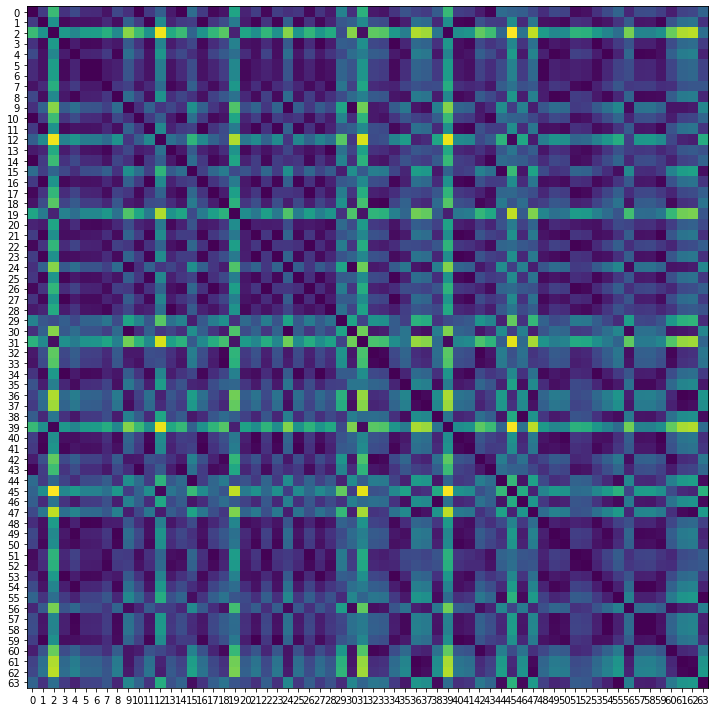

In [162]:
fig, ax = plt.subplots(figsize=(10,10))
im = ax.imshow(result)
ax.set_xticks(np.arange(size))
ax.set_yticks(np.arange(size))
ax.set_xticklabels(range(size), fontsize=10)
ax.set_yticklabels(range(size), fontsize=10)
#for i in range(size):
    #for j in range(size):
        #text = ax.text(j, i, f"{result[i, j]:.2f}",
         #              ha="center", va="center", color="w", fontsize=10)
fig.tight_layout()

plt.show()

In [ ]:
def get_data():
    R1 =  Dataset('data/T2m_R1_ym_1stMill.nc', 'r')
    temperature = R1.variables['T2m'][:]
    lat = R1.variables['lat'][:]
    lon = R1.variables['lon'][:]

    return temperature

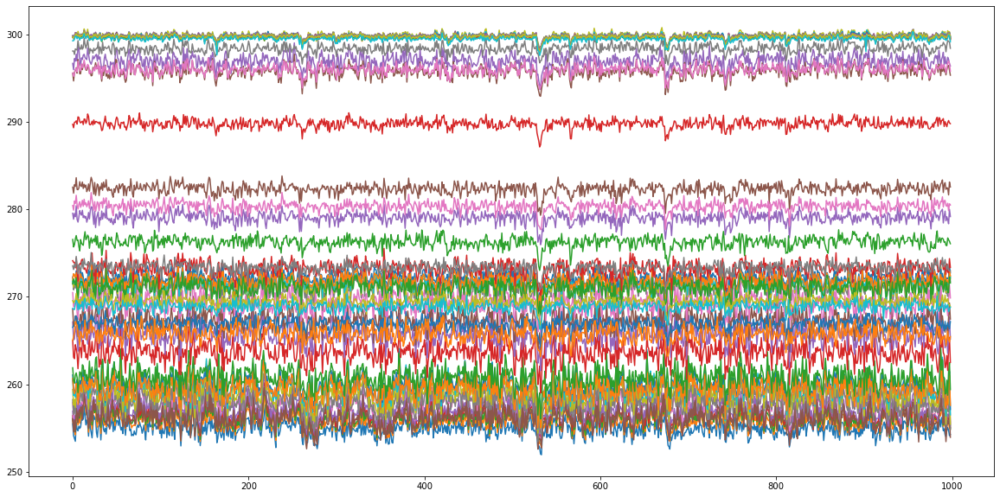

In [47]:
plt.figure(figsize=(20,10))
plt.plot(get_data()[:,:50,50])
